# V3

### Download packages

In [1]:
%pip install SoccerNet opencv-python tqdm matplotlib pandas ultralytics torch torchvision --quiet

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [15]:
from pathlib import Path
import zipfile
import json
import shutil
import cv2
from collections import defaultdict
import os
import json
import pandas as pd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import random

### Data Download and unzip

In [ ]:
SOCCERNET_DIR = Path("path/to/SoccerNet")      # root download directory
WORK_DIR      = Path("work")                  # where we'll build YOLO dataset, crops, outputs
WORK_DIR.mkdir(parents=True, exist_ok=True)

print("SOCCERNET_DIR:", SOCCERNET_DIR.resolve())
print("WORK_DIR:", WORK_DIR.resolve())

SOCCERNET_DIR: C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\path\to\SoccerNet
WORK_DIR: C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work


In [ ]:
from SoccerNet.Downloader import SoccerNetDownloader
mySoccerNetDownloader = SoccerNetDownloader(LocalDirectory="data/SoccerNetGS")
mySoccerNetDownloader.downloadDataTask(task="gamestate-2024",
                                       split=["train", "valid", "test", "challenge"])

In [ ]:
DATA_ROOT = Path("data/SoccerNetGS")
ZIP_ROOT  = DATA_ROOT / "gamestate-2024"

print("DATA_ROOT:", DATA_ROOT.resolve())
print("ZIP_ROOT :", ZIP_ROOT.resolve())
print("Zips found:", list(ZIP_ROOT.glob("*.zip")))


DATA_ROOT: C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\data\SoccerNetGS
ZIP_ROOT : C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\data\SoccerNetGS\gamestate-2024
Zips found: [WindowsPath('data/SoccerNetGS/gamestate-2024/challenge.zip'), WindowsPath('data/SoccerNetGS/gamestate-2024/test.zip'), WindowsPath('data/SoccerNetGS/gamestate-2024/train.zip'), WindowsPath('data/SoccerNetGS/gamestate-2024/valid.zip')]


In [ ]:
def unzip(zip_path: Path, out_dir: Path):
    out_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(out_dir)
    print(f"✅ Unzipped {zip_path.name} -> {out_dir}")

for split in ["train", "valid", "test", "challenge"]:
    z = ZIP_ROOT / f"{split}.zip"
    out = DATA_ROOT / split
    if not z.exists():
        print("❌ Missing zip:", z)
        continue
    # Skip if already unzipped (basic check)
    if out.exists() and any(out.iterdir()):
        print(f"⏭️  Looks already unzipped: {out}")
    else:
        unzip(z, out)

### Initial Data Analysis

In [5]:
def count_files(p: Path, pattern="*"):
    return len(list(p.rglob(pattern)))

for split in ["train", "valid", "test", "challenge"]:
    d = DATA_ROOT / split
    if not d.exists():
        continue
    print(f"\n=== {split.upper()} ===")
    print("folders:", len([x for x in d.iterdir() if x.is_dir()]))
    print("json:", count_files(d, "*.json"))
    print("mp4:", count_files(d, "*.mp4"))
    print("jpg:", count_files(d, "*.jpg"))
    print("png:", count_files(d, "*.png"))


=== TRAIN ===
folders: 57
json: 58
mp4: 0
jpg: 42750
png: 0

=== VALID ===
folders: 58
json: 59
mp4: 0
jpg: 43500
png: 0

=== TEST ===
folders: 49
json: 50
mp4: 0
jpg: 36750
png: 0

=== CHALLENGE ===
folders: 36
json: 1
mp4: 0
jpg: 27000
png: 0


This cell scans the dataset to find all label JSONs, loads one example clip’s annotations, and confirms we’re on dataset version 1.3 and that the labels contain the key structures we need: frame list, object annotations, and class definitions.

In [ ]:
label_files = []
for split in ["train", "valid", "test", "challenge"]:
    label_files += list((DATA_ROOT / split).rglob("Labels-GameState.json"))

print("Found Labels-GameState.json:", len(label_files))
for p in label_files[:10]:
    print(" -", p)

if len(label_files) == 0:
    raise RuntimeError("No Labels-GameState.json found. The unzip or folder structure may be different.")

labels_path = label_files[0]
with open(labels_path, "r", encoding="utf-8") as f:
    labels = json.load(f)

print("Opened:", labels_path)
print("Top-level keys:", list(labels.keys())[:20])

# Version check
info = labels.get("info", {})
print("Dataset info:", info)
print("Version:", info.get("version"))

Found Labels-GameState.json: 164
 - data\SoccerNetGS\train\SNGS-060\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-061\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-062\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-063\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-064\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-065\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-066\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-067\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-068\Labels-GameState.json
 - data\SoccerNetGS\train\SNGS-069\Labels-GameState.json
Opened: data\SoccerNetGS\train\SNGS-060\Labels-GameState.json
Top-level keys: ['info', 'images', 'annotations', 'categories']
Dataset info: {'version': '1.3', 'game_id': '4', 'id': '060', 'num_tracklets': '26', 'action_position': '895', 'action_class': 'Kick-off', 'visibility': 'visible', 'game_time_start': '1 - 00:00', 'game_time_stop': '1 - 00:30', 'clip_start': '0', 'clip_stop': '30000', 'na

This cell just inspects the JSON structure to confirm where the annotations are stored; here they’re in labels['annotations'] as a list, so we can iterate over them to extract boxes, teams, track IDs, etc.

In [8]:
def preview_dict(d, n=20):
    for i, k in enumerate(d.keys()):
        if i >= n:
            break
        print(" -", k)

print("labels keys:")
preview_dict(labels, n=40)

# Try to guess where annotations live:
candidates = ["annotations", "data", "clips", "sequences", "games", "samples"]
for k in candidates:
    if k in labels:
        print("\n✅ Found likely annotation container:", k, "type:", type(labels[k]))


labels keys:
 - info
 - images
 - annotations
 - categories

✅ Found likely annotation container: annotations type: <class 'list'>


This cell locates the frames for one clip (SNGS-060/img1), checks how many images there are, and displays the first frame to verify we can load and visualize the raw data before adding any detection or labels.

Sequence dir: data\SoccerNetGS\train\SNGS-060
Image dir: data\SoccerNetGS\train\SNGS-060\img1
Exists: True
Num frames: 750
First 5: ['000001.jpg', '000002.jpg', '000003.jpg', '000004.jpg', '000005.jpg']


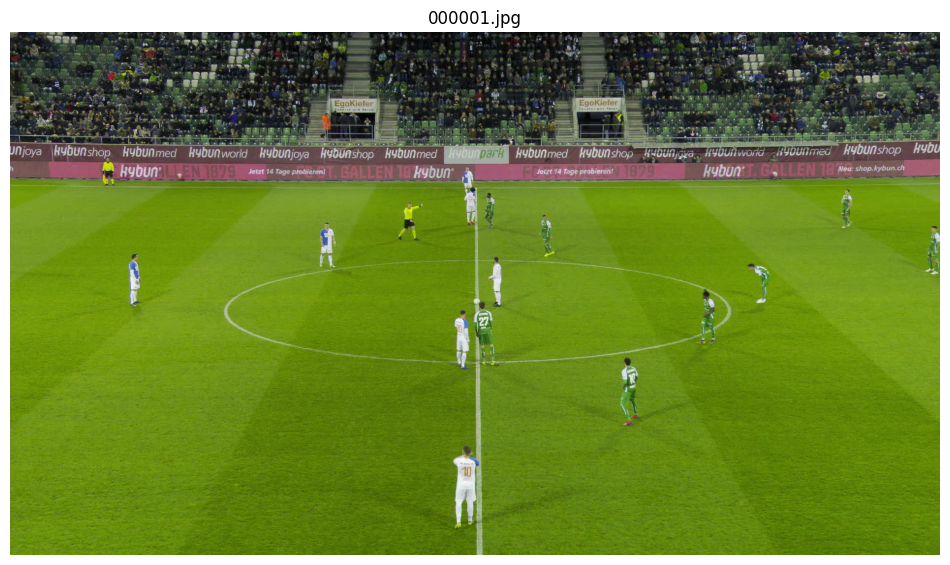

In [ ]:
seq_dir = labels_path.parent  # .../train/SNGS-060
img_dir = seq_dir / labels["info"]["im_dir"]  # usually img1
print("Sequence dir:", seq_dir)
print("Image dir:", img_dir)
print("Exists:", img_dir.exists())

# list a few frames
jpgs = sorted(img_dir.glob("*.jpg"))
print("Num frames:", len(jpgs))
print("First 5:", [p.name for p in jpgs[:5]])

# load first frame
if len(jpgs) > 0:
    img_bgr = cv2.imread(str(jpgs[0]))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12,7))
    plt.imshow(img_rgb)
    plt.title(jpgs[0].name)
    plt.axis("off")
    plt.show()


This cell displays the class dictionary of the dataset: it maps each category_id to a human-readable name and shows which categories are actual objects we detect versus pitch/camera metadata.

In [ ]:
cats = labels["categories"]
df_cats = pd.DataFrame(cats)
df_cats

,supercategory,id,name,lines
0,object,1,player,NaN
1,object,2,goalkeeper,NaN
2,object,3,referee,NaN
3,object,4,ball,NaN
4,pitch,5,pitch,"[Big rect. left bottom, Big rect. left main, B..."
5,camera,6,camera,NaN
6,object,7,other,NaN


This cell samples one annotation to verify the schema: it shows that each labeled object includes its class, team side, track ID, pixel bounding box for detection, and pitch coordinates for heatmaps/average positions.

In [ ]:
a = random.choice(labels["annotations"])
print("Annotation keys:", list(a.keys()))

# show full annotation (pretty)
print(json.dumps(a, indent=2)[:2000])

Annotation keys: ['id', 'image_id', 'track_id', 'supercategory', 'category_id', 'attributes', 'bbox_image', 'bbox_pitch', 'bbox_pitch_raw']
{
  "id": "1060013693",
  "image_id": "1060000692",
  "track_id": 6,
  "supercategory": "object",
  "category_id": 1,
  "attributes": {
    "role": "player",
    "jersey": null,
    "team": "right"
  },
  "bbox_image": {
    "x": 1084,
    "y": 374,
    "x_center": 1100.0,
    "y_center": 414.0,
    "w": 32,
    "h": 80
  },
  "bbox_pitch": {
    "x_bottom_left": 12.8709864969695,
    "y_bottom_left": 2.2602181450926695,
    "x_bottom_right": 13.600071703471277,
    "y_bottom_right": 2.3992310821679097,
    "x_bottom_middle": 13.235548175209425,
    "y_bottom_middle": 2.3297086762463404
  },
  "bbox_pitch_raw": {
    "x_bottom_left": 12.89410977509841,
    "y_bottom_left": 2.2270844483476444,
    "x_bottom_right": 13.617314308480807,
    "y_bottom_right": 2.3643405717933703,
    "x_bottom_middle": 13.255730131534653,
    "y_bottom_middle": 2.295696

This cell inspects the per-frame metadata to get the frame filename and its width/height, which we need to map annotations to the correct JPG and to normalize pixel bounding boxes into YOLO format.

In [13]:
# COCO bbox is [x, y, w, h] in pixels
im0 = labels["images"][0]
print("Image keys:", im0.keys())
print("Example image entry:", im0)

# find width/height if present
W = im0.get("width", None)
H = im0.get("height", None)
print("W,H:", W, H)


Image keys: dict_keys(['is_labeled', 'image_id', 'file_name', 'height', 'width', 'has_labeled_person', 'has_labeled_pitch', 'has_labeled_camera', 'ignore_regions_y', 'ignore_regions_x'])
Example image entry: {'is_labeled': True, 'image_id': '1060000001', 'file_name': '000001.jpg', 'height': 1080, 'width': 1920, 'has_labeled_person': True, 'has_labeled_pitch': True, 'has_labeled_camera': True, 'ignore_regions_y': [], 'ignore_regions_x': []}
W,H: 1920 1080


### Data to YOLO-ready dataset (GameState to Ultralytics format)

In this section we convert the SoccerNet GameState annotations for each clip (`Labels-GameState.json`) into a YOLO/Ultralytics-compatible detection dataset. Each clip contains a folder of frames (e.g., `img1/000001.jpg …`) and COCO-like annotations (`images`, `annotations`, `categories`). We:

- select the detection classes: **player, goalkeeper, referee, ball, other**
- map `category_id → class index` (`name_to_yolo`)
- group all object annotations by `image_id` (`anns_by_img`)
- convert `bbox_image` from pixel units to YOLO normalized format `(cx, cy, w, h)` using the frame’s `(W, H)`
- export frames and labels into the standard folder layout:

work/<YOLO_DIR>/
images/
train/
val/
labels/
train/
val/
data.yaml


The output `data.yaml` points Ultralytics to the exported `train`/`val` image folders and defines the class names, making the dataset ready for YOLO training and evaluation.

Export YOLO dataset from all clips in train and valid

In [16]:
# ---- config ----
KEEP_NAMES = ["player", "goalkeeper", "referee", "ball", "other"]
name_to_yolo = {n: i for i, n in enumerate(KEEP_NAMES)}

YOLO_DIR = WORK_DIR / "yolo_gamestate_all"
(img_train := YOLO_DIR/"images"/"train").mkdir(parents=True, exist_ok=True)
(lbl_train := YOLO_DIR/"labels"/"train").mkdir(parents=True, exist_ok=True)
(img_val   := YOLO_DIR/"images"/"val").mkdir(parents=True, exist_ok=True)
(lbl_val   := YOLO_DIR/"labels"/"val").mkdir(parents=True, exist_ok=True)

def bbox_image_to_yolo(b, W, H):
    cx = b["x_center"] / W
    cy = b["y_center"] / H
    nw = b["w"] / W
    nh = b["h"] / H
    return cx, cy, nw, nh

def export_split(split_name: str, out_img: Path, out_lbl: Path, max_clips=None):
    label_files = sorted((DATA_ROOT / split_name).rglob("Labels-GameState.json"))
    if max_clips:
        label_files = label_files[:max_clips]

    n_imgs = 0
    n_lbls = 0

    for labels_path in label_files:
        seq_dir = labels_path.parent
        clip_id = seq_dir.name  # e.g. SNGS-060

        labels = json.loads(labels_path.read_text(encoding="utf-8"))

        cat_id_to_name = {c["id"]: c["name"] for c in labels["categories"]}
        img_id_to_name = {im["image_id"]: im["file_name"] for im in labels["images"]}

        # group annotations by image_id (filtered)
        anns_by_img = defaultdict(list)
        for a in labels["annotations"]:
            cname = cat_id_to_name.get(a["category_id"])
            if cname in KEEP_NAMES and a.get("supercategory") == "object":
                anns_by_img[a["image_id"]].append(a)

        img_dir = seq_dir / labels["info"]["im_dir"]  # usually img1

        for img_id, fname in img_id_to_name.items():
            src = img_dir / fname
            if not src.exists():
                continue

            im = cv2.imread(str(src))
            if im is None:
                continue
            H, W = im.shape[:2]

            lines = []
            for a in anns_by_img.get(img_id, []):
                cname = cat_id_to_name[a["category_id"]]
                cls = name_to_yolo[cname]
                b = a["bbox_image"]
                cx, cy, nw, nh = bbox_image_to_yolo(b, W, H)
                lines.append(f"{cls} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}")

            if not lines:
                continue

            # avoid filename collisions across clips
            new_name = f"{clip_id}_{fname}"
            shutil.copy2(src, out_img / new_name)
            (out_lbl / (Path(new_name).stem + ".txt")).write_text("\n".join(lines))

            n_imgs += 1
            n_lbls += len(lines)

    print(f"{split_name}: exported images={n_imgs}, labels={n_lbls}")
    return n_imgs, n_lbls

# Export all train + valid clips
export_split("train", img_train, lbl_train, max_clips=None)
export_split("valid", img_val, lbl_val, max_clips=None)

print("YOLO_DIR:", YOLO_DIR)

train: exported images=42750, labels=733001
valid: exported images=43500, labels=748666
YOLO_DIR: work\yolo_gamestate_all


Write data.yaml for Ultralytics

In [17]:
data_yaml = f"""
path: {YOLO_DIR.as_posix()}
train: images/train
val: images/val

names:
{chr(10).join([f"  {i}: {n}" for n, i in name_to_yolo.items()])}
""".strip()

(YOLO_DIR / "data.yaml").write_text(data_yaml)
print((YOLO_DIR / "data.yaml").read_text())

path: work/yolo_gamestate_all
train: images/train
val: images/val

names:
  0: player
  1: goalkeeper
  2: referee
  3: ball
  4: other


### Get and preprocess a small subset of data for development

2 training clips and 1 validation clips

In [18]:
YOLO_SUBSET_DIR = WORK_DIR / "yolo_gamestate_subset_v1"
(img_train := YOLO_SUBSET_DIR/"images"/"train").mkdir(parents=True, exist_ok=True)
(lbl_train := YOLO_SUBSET_DIR/"labels"/"train").mkdir(parents=True, exist_ok=True)
(img_val   := YOLO_SUBSET_DIR/"images"/"val").mkdir(parents=True, exist_ok=True)
(lbl_val   := YOLO_SUBSET_DIR/"labels"/"val").mkdir(parents=True, exist_ok=True)

# export a small subset
export_split("train", img_train, lbl_train, max_clips=2)
export_split("valid", img_val, lbl_val, max_clips=1)

# write data.yaml for the subset
data_yaml = f"""
path: {YOLO_SUBSET_DIR.as_posix()}
train: images/train
val: images/val

names:
{chr(10).join([f"  {i}: {n}" for n, i in name_to_yolo.items()])}
""".strip()

(YOLO_SUBSET_DIR / "data.yaml").write_text(data_yaml)
print("✅ Subset YOLO dataset ready:", YOLO_SUBSET_DIR)
print((YOLO_SUBSET_DIR / "data.yaml").read_text())


train: exported images=1500, labels=24729
valid: exported images=750, labels=12678
✅ Subset YOLO dataset ready: work\yolo_gamestate_subset_v1
path: work/yolo_gamestate_subset_v1
train: images/train
val: images/val

names:
  0: player
  1: goalkeeper
  2: referee
  3: ball
  4: other


### Training YOLO (on subset of data initially)

In [19]:

from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\gerry\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Select dataset + sanity checks

In [20]:
from pathlib import Path

# ---- choose dataset ----
YOLO_DIR = WORK_DIR / "yolo_gamestate_subset_v1"
# YOLO_DIR = WORK_DIR / "yolo_gamestate_all"

DATA_YAML = YOLO_DIR / "data.yaml"
assert DATA_YAML.exists(), f"Missing {DATA_YAML}"

# runs output folder
RUNS_DIR = WORK_DIR / "runs"
RUNS_DIR.mkdir(parents=True, exist_ok=True)

# quick sanity checks
train_dir = YOLO_DIR / "images" / "train"
val_dir   = YOLO_DIR / "images" / "val"
assert train_dir.exists() and any(train_dir.glob("*.jpg")), "Train images not found"
assert val_dir.exists() and any(val_dir.glob("*.jpg")), "Val images not found"

print("DATA_YAML:", DATA_YAML)
print("Train images:", len(list(train_dir.glob("*.jpg"))))
print("Val images  :", len(list(val_dir.glob("*.jpg"))))
print("RUNS_DIR    :", RUNS_DIR)


DATA_YAML: work\yolo_gamestate_subset_v1\data.yaml
Train images: 1500
Val images  : 750
RUNS_DIR    : work\runs


Choose training settings (good defaults)

In [ ]:
# ---- development training settings ----
RUN_NAME = "gs_subset_yolov8n_v1"

WEIGHTS = "yolov8n.pt" # fast baseline; later consider yolov8s.pt for higher quality

IMGSZ = 640              # your frames are 1920x1080; 960 keeps more detail than 640
EPOCHS = 3              # for subset; overnight on full you might go 100-300
BATCH = 16                # increase if GPU allows, otherwise reduce
PATIENCE = 20            # early stopping patience (stops if no improvement)

CONF_PRED = 0.25         # prediction conf threshold for visualization

# device: None lets Ultralytics auto-pick GPU if available
DEVICE = None  # e.g. 0 for first GPU, "cpu" if you want CPU explicitly


Train (with early stopping + saved runs)

In [24]:
model = YOLO(WEIGHTS)

train_results = model.train(
    data=str(DATA_YAML),
    imgsz=640,
    epochs=3,
    batch=16,        # reduce if out of memory
    device=None,
    patience=5,
    workers=4,       # try 4; on Windows sometimes 0/2 is more stable
    project=str(RUNS_DIR),
    name=RUN_NAME+"_devfast",
    exist_ok=True,
)

Ultralytics 8.4.6  Python-3.13.3 torch-2.9.1+cu126 CPU (Snapdragon X 12-core X1E80100 @ 3.40 GHz)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=work\yolo_gamestate_subset_v1\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=gs_subset_yolov8n_v1_devfast, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=


Validate (gives you metrics like mAP50 / mAP50-95)

In [28]:
val_results = model.val(
    data=str(DATA_YAML),
    device=DEVICE,
    project=str(RUNS_DIR),
    name=(RUN_NAME+"_devfast") + "_val",
    exist_ok=True,
)

val_results

Ultralytics 8.4.6  Python-3.13.3 torch-2.9.1+cu126 CPU (Snapdragon X 12-core X1E80100 @ 3.40 GHz)
val: Fast image access  (ping: 0.00.0 ms, read: 345.2115.8 MB/s, size: 179.3 KB)
val: Scanning C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\labels\val.cache... 750 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 750/750 104.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 47/47 1.2s/it 54.5s1.2ss
                   all        750      12678      0.973      0.216      0.239      0.139
                player        750      10338      0.891      0.863      0.903      0.522
            goalkeeper        397        397          1          0    0.00277    0.00128
               referee        750       1191          1          0     0.0496     0.0314
                  ball        750        752          1          0   4.45e-05   1.06e-05
Speed: 0.4ms preprocess, 47.2

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002C95BBDF2F0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
       

Plot metrics across epochs (your “accuracy visualization”)

In [30]:
import pandas as pd
from pathlib import Path

run_dir = Path(r"C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\runs\detect\work\runs\gs_subset_yolov8n_v1_devfast")
results_csv = run_dir / "results.csv"

print("Looking for:", results_csv)
assert results_csv.exists(), f"Missing {results_csv}"

df = pd.read_csv(results_csv)
print(df.columns.tolist())
df.tail()


Looking for: C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\runs\detect\work\runs\gs_subset_yolov8n_v1_devfast\results.csv
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2', 'lr/pg3', 'lr/pg4', 'lr/pg5', 'lr/pg6', 'lr/pg7']


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2,lr/pg3,lr/pg4,lr/pg5,lr/pg6,lr/pg7
0,1,1436.42,1.76545,3.70902,1.00474,0.03581,0.22610,0.19416,0.10338,1.49382,2.94641,0.95657,0.001099,0.000366,0.001099,0.000366,0.001099,0.000366,0.001099,0.000366
1,2,2805.17,1.69546,1.54632,0.96939,0.96975,0.21353,0.22859,0.13084,1.43893,1.32493,0.95537,0.001481,0.000494,0.001481,0.000494,0.001481,0.000494,0.001481,0.000494
2,3,3738.04,1.58694,1.17888,0.94324,0.97299,0.21581,0.23892,0.13868,1.37930,1.11859,0.94343,0.001129,0.000376,0.001129,0.000376,0.001129,0.000376,0.001129,0.000376


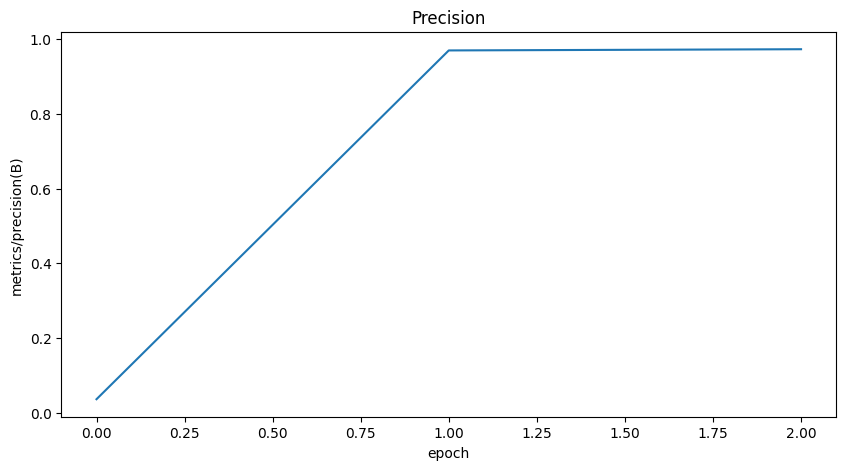

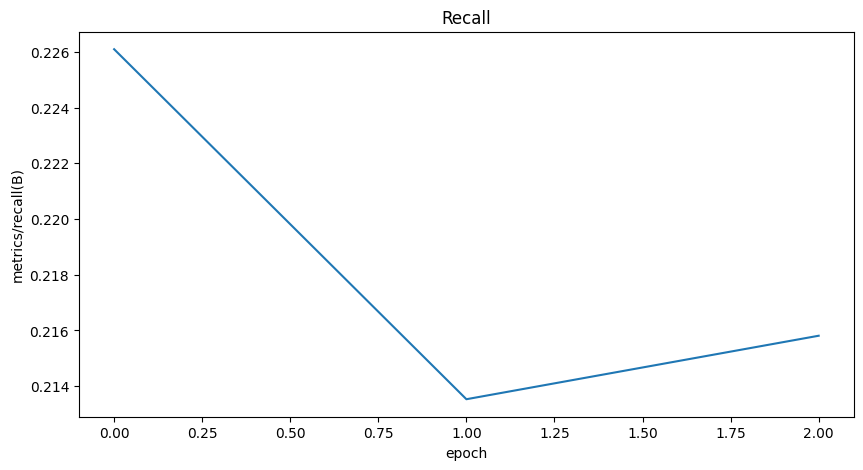

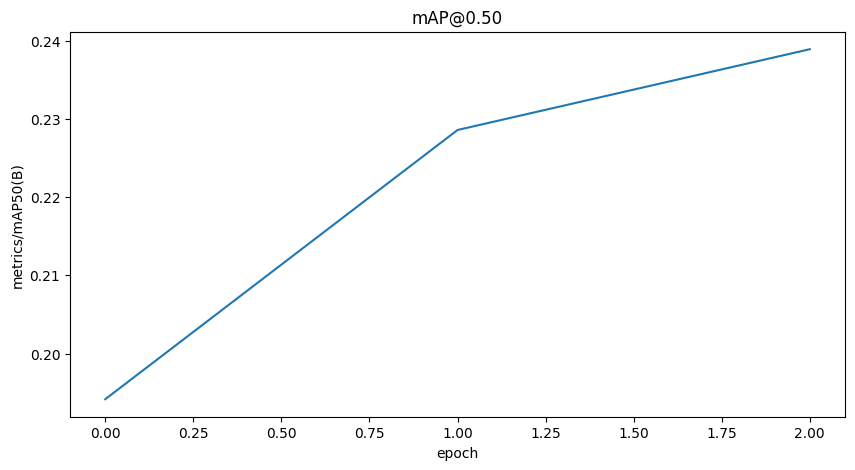

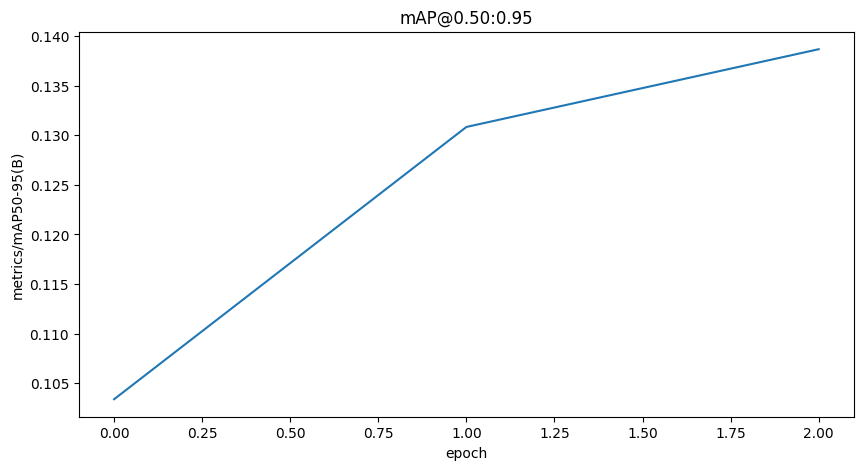

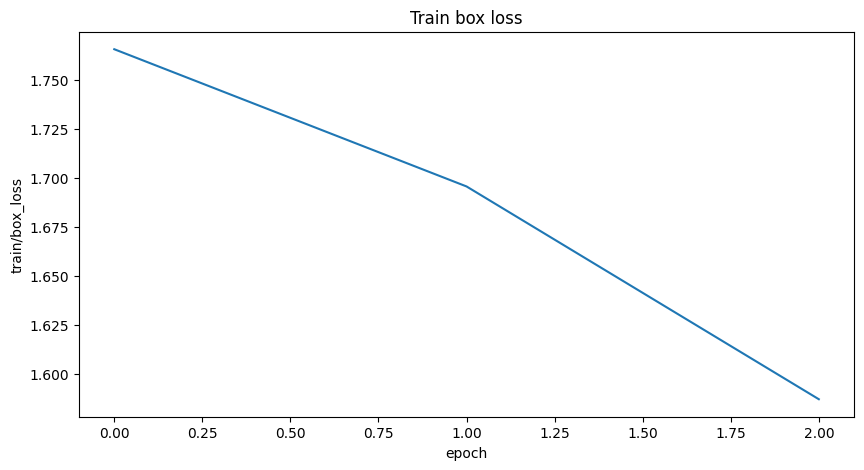

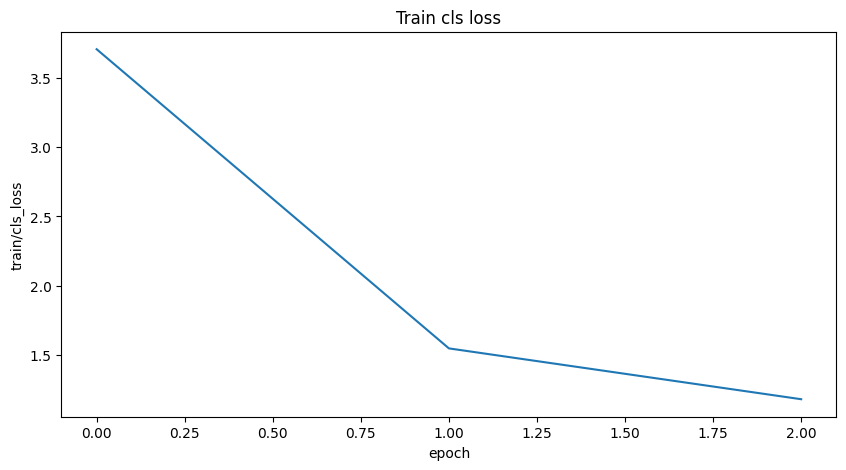

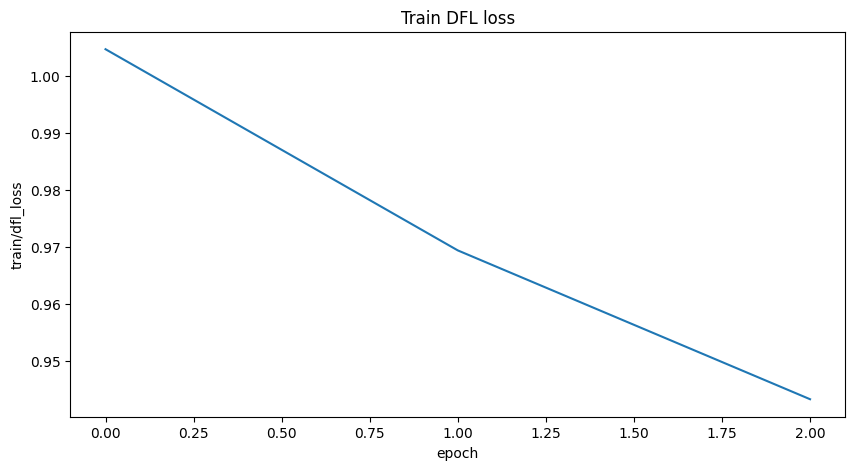

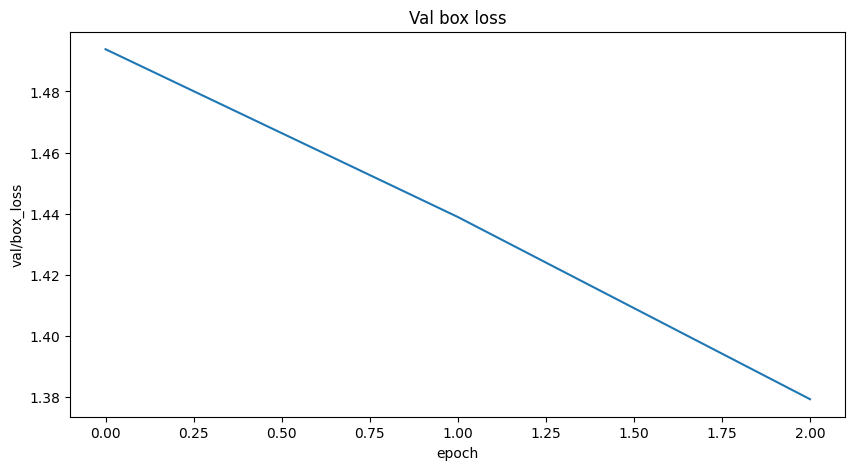

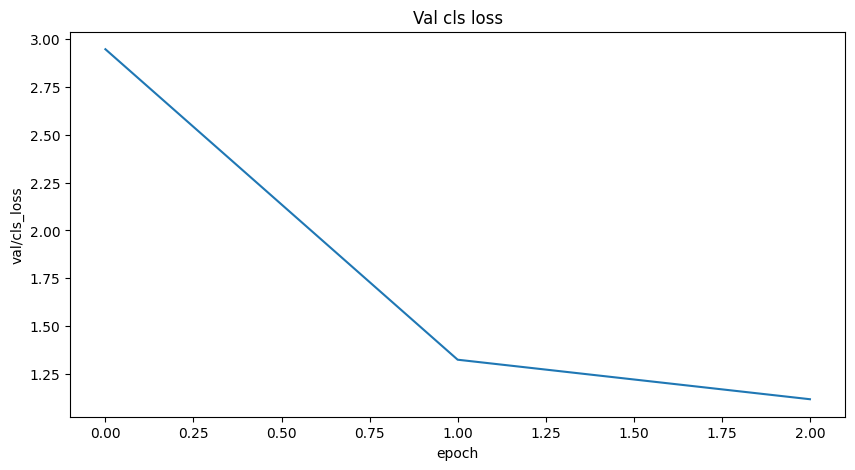

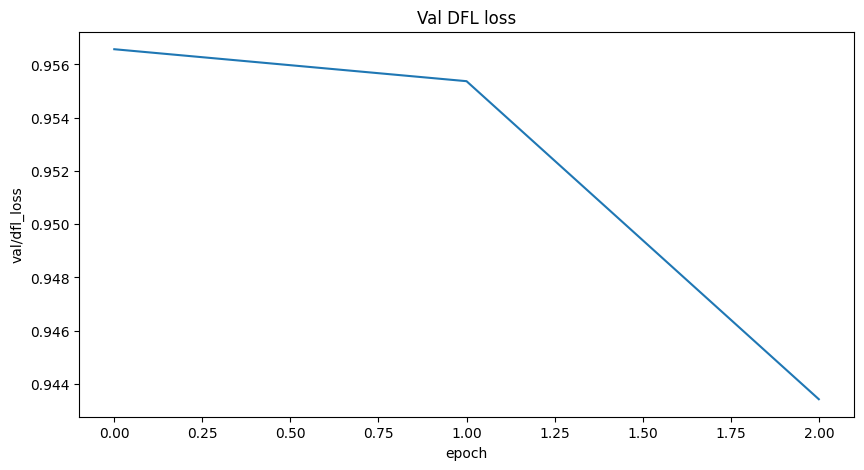

In [31]:
def plot_col(col, title=None):
    if col not in df.columns:
        print("Missing column:", col)
        return
    plt.figure(figsize=(10,5))
    plt.plot(df[col])
    plt.xlabel("epoch")
    plt.ylabel(col)
    plt.title(title or col)
    plt.show()

# Common YOLOv8 metrics columns
plot_col("metrics/precision(B)", "Precision")
plot_col("metrics/recall(B)", "Recall")
plot_col("metrics/mAP50(B)", "mAP@0.50")
plot_col("metrics/mAP50-95(B)", "mAP@0.50:0.95")

# Loss curves (good for diagnosing training)
plot_col("train/box_loss", "Train box loss")
plot_col("train/cls_loss", "Train cls loss")
plot_col("train/dfl_loss", "Train DFL loss")
plot_col("val/box_loss", "Val box loss")
plot_col("val/cls_loss", "Val cls loss")
plot_col("val/dfl_loss", "Val DFL loss")


Load the best checkpoint (for consistent inference)

In [33]:
#best_path = RUNS_DIR / "detect" / RUN_NAME / "weights" / "best.pt"
best_path = Path(r"C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\runs\detect\work\runs\gs_subset_yolov8n_v1_devfast\weights\best.pt")
assert best_path.exists(), f"Missing {best_path}"

best_model = YOLO(str(best_path))
print("Loaded best model:", best_path)

Loaded best model: C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\runs\detect\work\runs\gs_subset_yolov8n_v1_devfast\weights\best.pt


Predict on validation images (confidence-based)

In [34]:
VAL_DIR = YOLO_DIR / "images" / "val"
PRED_NAME = RUN_NAME + "_pred"

pred_results = best_model.predict(
    source=str(VAL_DIR),
    conf=CONF_PRED,
    save=True,
    project=str(RUNS_DIR),
    name=PRED_NAME,
    exist_ok=True,
)


image 1/750 c:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\images\val\SNGS-021_000001.jpg: 384x640 14 players, 393.7ms
image 2/750 c:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\images\val\SNGS-021_000002.jpg: 384x640 14 players, 126.4ms
image 3/750 c:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\images\val\SNGS-021_000003.jpg: 384x640 14 players, 60.0ms
image 4/750 c:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\images\val\SNGS-021_000004.jpg: 384x640 13 players, 54.4ms
image 5/750 c:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\images\val\SNGS-021_000005.jpg: 384x640 13 players, 58.0ms
image 6/750 c:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\work\yolo_gamestate_subset_v1\images\val\SNGS-021_000006.jpg

Visualize a few predictions

Prediction dir: C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\runs\detect\work\runs\gs_subset_yolov8n_v1_pred
Showing: 6 images


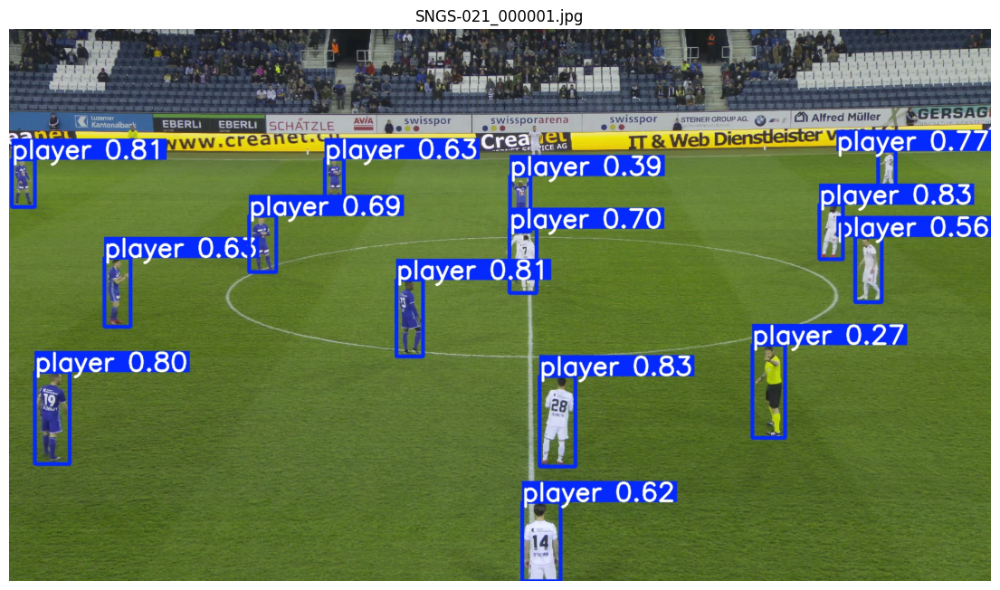

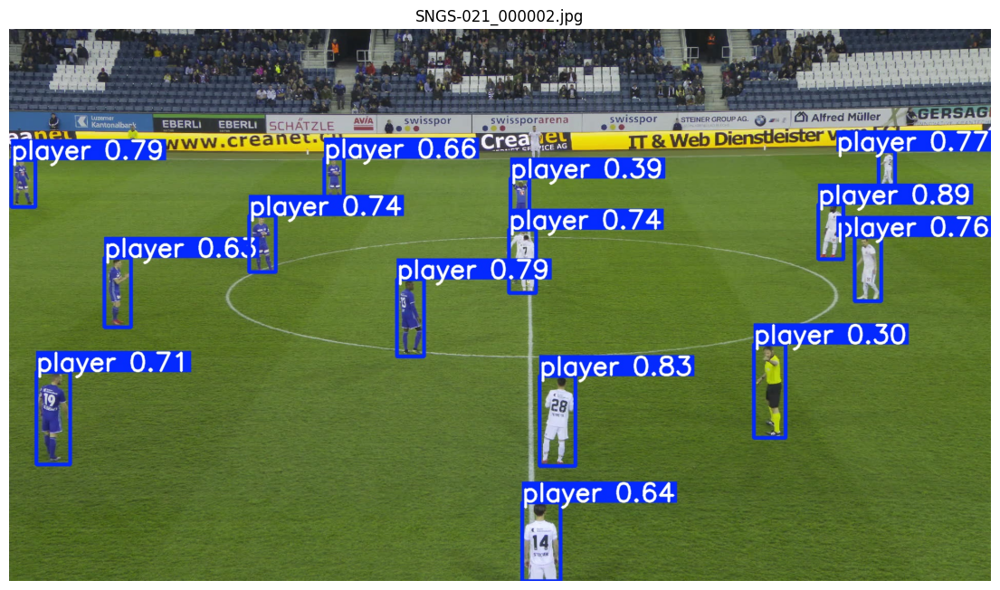

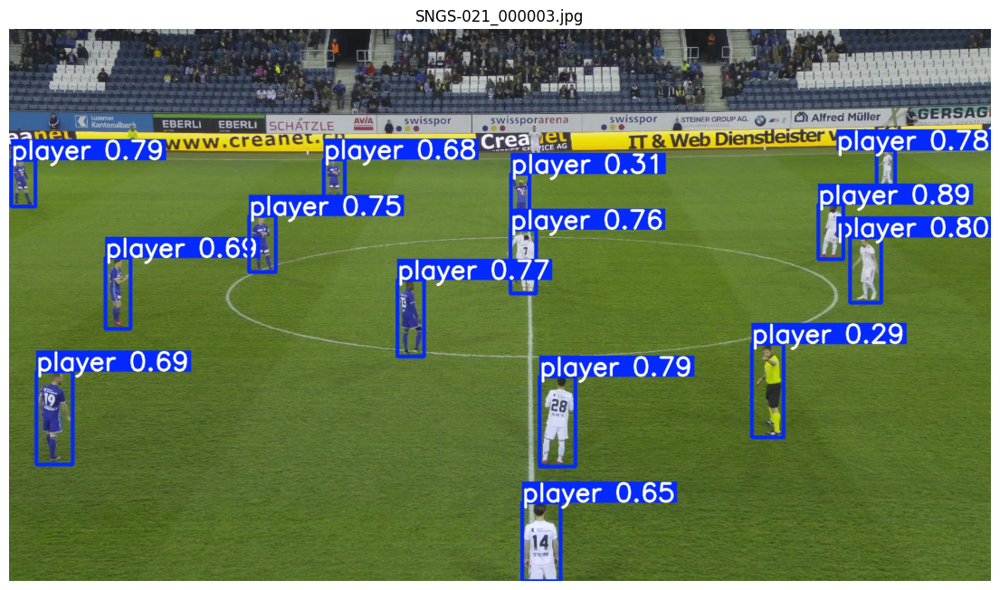

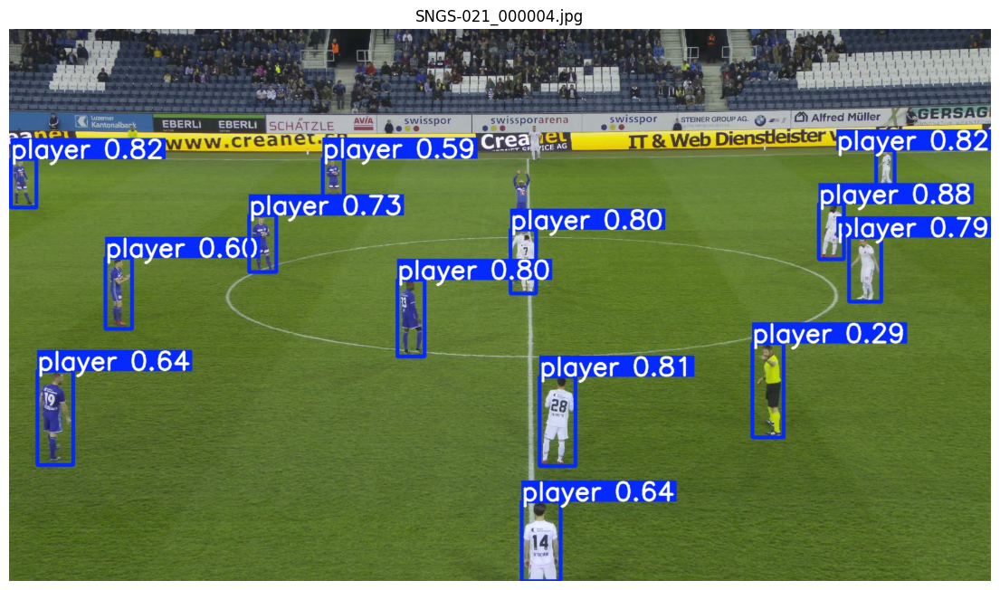

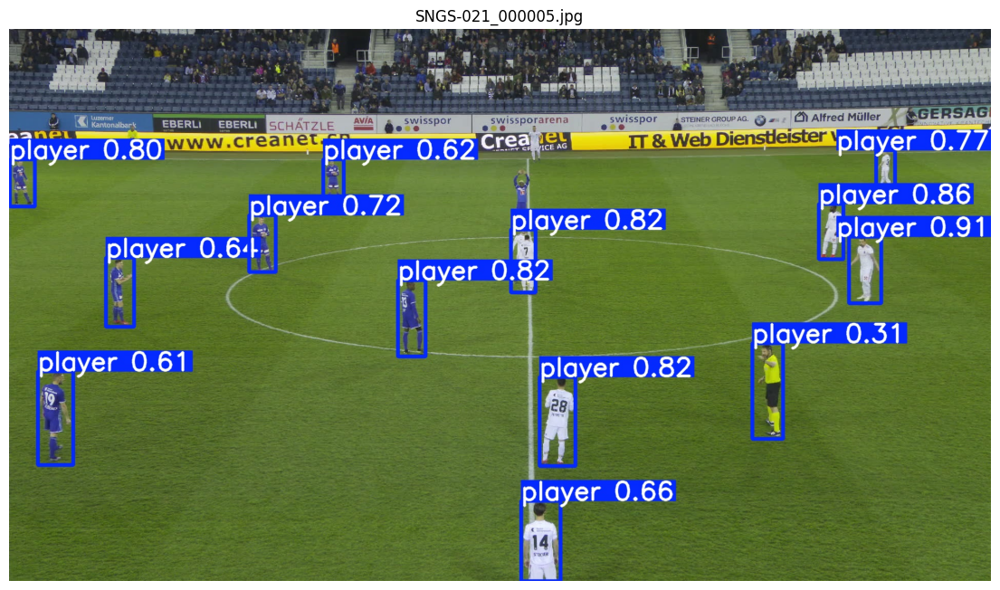

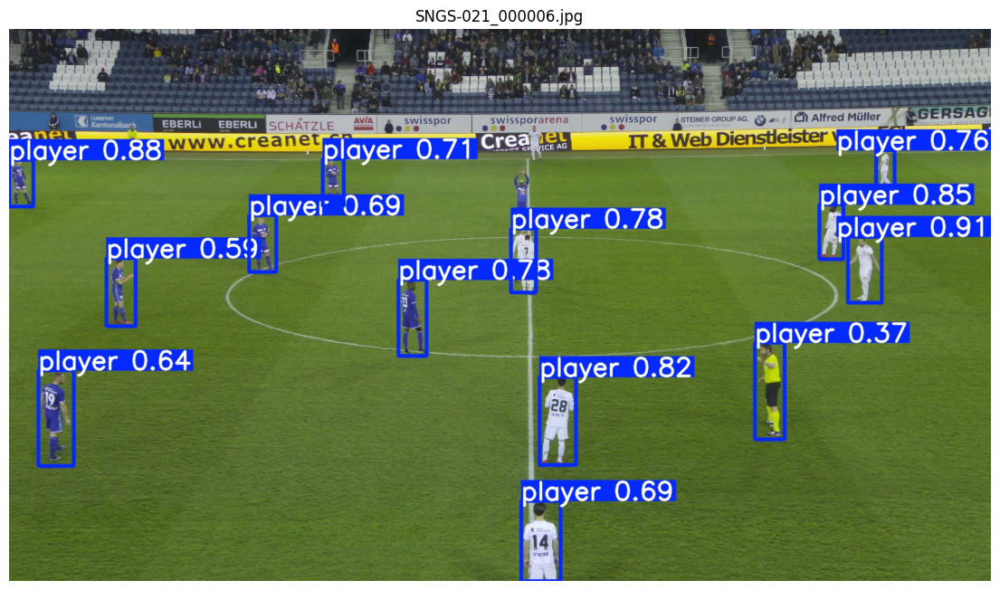

In [36]:
#pred_dir = RUNS_DIR / "detect" / PRED_NAME
pred_dir = Path(r"C:\Users\gerry\OneDrive\ESSEC-CS\M2\Foundations_Deep_Learning\Project\runs\detect\work\runs\gs_subset_yolov8n_v1_pred")
imgs = sorted(pred_dir.glob("*.jpg"))[:6]

print("Prediction dir:", pred_dir)
print("Showing:", len(imgs), "images")

for p in imgs:
    im_bgr = cv2.imread(str(p))
    if im_bgr is None:
        continue
    im_rgb = cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(14, 8))
    plt.imshow(im_rgb)
    plt.axis("off")
    plt.title(p.name)
    plt.show()


## Create an MP4 illustrating YOLO performance

In [37]:
def make_yolo_clip_video(
    model,
    clip_dir,
    out_mp4,
    img_subdir="img1",
    fps=25,
    conf=0.25,
    iou=0.7,
    frame_stride=1,
    max_frames=None,
    show_progress_every=50,
):
    """
    Render an MP4 for a SoccerNetGS clip by running YOLO on each frame and drawing predictions.

    Args:
        model: an ultralytics.YOLO model instance (already loaded)
        clip_dir: Path or str to clip folder (e.g., data/SoccerNetGS/valid/SNGS-021)
        out_mp4: Path or str for output mp4
        img_subdir: frames folder name inside clip_dir (default "img1")
        fps: output video FPS (default 25)
        conf: prediction confidence threshold
        iou: NMS IoU threshold
        frame_stride: process every Nth frame (>=1). Use >1 to speed up on CPU.
        max_frames: optionally cap number of processed frames
        show_progress_every: print progress every N frames
    """
    from pathlib import Path
    import cv2

    clip_dir = Path(clip_dir)
    out_mp4 = Path(out_mp4)
    img_dir = clip_dir / img_subdir

    if not img_dir.exists():
        raise FileNotFoundError(f"Missing frames folder: {img_dir}")

    frames = sorted(img_dir.glob("*.jpg"))
    if not frames:
        raise FileNotFoundError(f"No .jpg frames found in {img_dir}")

    if frame_stride < 1:
        raise ValueError("frame_stride must be >= 1")

    frames = frames[::frame_stride]
    if max_frames is not None:
        frames = frames[:max_frames]

    # read first frame to get size
    first = cv2.imread(str(frames[0]))
    if first is None:
        raise RuntimeError(f"Could not read first frame: {frames[0]}")
    H, W = first.shape[:2]

    out_mp4.parent.mkdir(parents=True, exist_ok=True)
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter(str(out_mp4), fourcc, fps, (W, H))

    try:
        for idx, f in enumerate(frames, 1):
            img_bgr = cv2.imread(str(f))
            if img_bgr is None:
                continue

            results = model.predict(
                source=img_bgr,
                conf=conf,
                iou=iou,
                verbose=False,
            )

            annotated = results[0].plot()  # BGR
            writer.write(annotated)

            if show_progress_every and idx % show_progress_every == 0:
                print(f"[{clip_dir.name}] processed {idx}/{len(frames)} frames...")

    finally:
        writer.release()

    print(f"✅ Saved video: {out_mp4}")
    return out_mp4


In [39]:
out = make_yolo_clip_video(best_model, r"data\SoccerNetGS\valid\SNGS-021", r"work\SNGS-021_yolo.mp4", conf=0.25, frame_stride=1)


[SNGS-021] processed 50/750 frames...
[SNGS-021] processed 100/750 frames...
[SNGS-021] processed 150/750 frames...
[SNGS-021] processed 200/750 frames...
[SNGS-021] processed 250/750 frames...
[SNGS-021] processed 300/750 frames...
[SNGS-021] processed 350/750 frames...
[SNGS-021] processed 400/750 frames...
[SNGS-021] processed 450/750 frames...
[SNGS-021] processed 500/750 frames...
[SNGS-021] processed 550/750 frames...
[SNGS-021] processed 600/750 frames...
[SNGS-021] processed 650/750 frames...
[SNGS-021] processed 700/750 frames...
[SNGS-021] processed 750/750 frames...
✅ Saved video: work\SNGS-021_yolo.mp4


## Team Classification Dataset (ResNet18) — Crop Generation (Players Only)

In this section we create a *classification dataset* for predicting which team a **player** belongs to (**left** vs **right**).

We use the **ground-truth annotations** from `Labels-GameState.json` (not YOLO predictions) to:
1) load each frame,
2) crop each **player** bounding box,
3) label the crop using `annotation["attributes"]["team"]` (`left` / `right`),
4) save crops to a standard folder structure:

work/team_crops_subset_v1/
train/left, train/right
val/left, val/right


This lets us train ResNet18 with simple image-folder loaders. We start on a small subset of clips for development, and later scale by increasing the number of clips.

### 1) Configuration

Set where the cropped dataset will be saved and how many clips to use for a fast development subset.


In [40]:
TEAM_CROP_DIR = WORK_DIR / "team_crops_subset_v1"

# Use small numbers for development (increase later)
TRAIN_MAX_CLIPS = 2
VALID_MAX_CLIPS = 1

# Crop filtering/format
MIN_BOX_AREA = 10 * 10   # skip very tiny boxes
PAD = 4                  # small padding around bbox

print("TEAM_CROP_DIR:", TEAM_CROP_DIR)


TEAM_CROP_DIR: work\team_crops_subset_v1


### 2) Helper functions

Utilities to list label files and safely crop bounding boxes within image bounds.

In [41]:
def list_label_files(data_root: Path, split_name: str, max_clips=None):
    files = sorted((data_root / split_name).rglob("Labels-GameState.json"))
    if max_clips:
        files = files[:max_clips]
    return files

def clamp(v, lo, hi):
    return max(lo, min(hi, v))

def crop_xywh(img, x, y, w, h, pad=0):
    H, W = img.shape[:2]
    x1 = clamp(int(x - pad), 0, W - 1)
    y1 = clamp(int(y - pad), 0, H - 1)
    x2 = clamp(int(x + w + pad), 0, W)
    y2 = clamp(int(y + h + pad), 0, H)
    if x2 <= x1 or y2 <= y1:
        return None
    return img[y1:y2, x1:x2]

### 3) Build crop dataset (players only - no keepers)

For each selected clip:
- read `Labels-GameState.json`
- keep only **player** annotations
- keep only labels with `team ∈ {left, right}`
- crop the player bbox from the frame
- save to `TEAM_CROP_DIR/train|val/left|right/`

We use `train` and `valid` splits from SoccerNetGS.


In [42]:
def build_team_crop_dataset(
    data_root: Path,
    out_dir: Path,
    train_max_clips: int = 2,
    valid_max_clips: int = 1,
    min_box_area: int = 400,
    pad: int = 4,
):
    # reset output folder
    if out_dir.exists():
        shutil.rmtree(out_dir)
    for split in ["train", "val"]:
        for team in ["left", "right"]:
            (out_dir / split / team).mkdir(parents=True, exist_ok=True)

    def process_split(src_split: str, dst_split: str, max_clips=None):
        label_files = list_label_files(data_root, src_split, max_clips=max_clips)
        print(f"{src_split}: using {len(label_files)} clips")

        saved = 0
        skipped = defaultdict(int)

        for labels_path in label_files:
            seq_dir = labels_path.parent
            clip_id = seq_dir.name
            labels = json.loads(labels_path.read_text(encoding="utf-8"))

            # category lookup by name
            cat_id_to_name = {c["id"]: c["name"] for c in labels["categories"]}
            player_cat_ids = {cid for cid, name in cat_id_to_name.items() if name == "player"}
            if not player_cat_ids:
                skipped["no_player_category"] += 1
                continue

            # image_id -> filename
            img_id_to_name = {im["image_id"]: im["file_name"] for im in labels["images"]}
            img_dir = seq_dir / labels["info"]["im_dir"]  # usually img1

            # group player annotations per frame
            anns_by_img = defaultdict(list)
            for a in labels["annotations"]:
                if a.get("supercategory") != "object":
                    continue
                if a.get("category_id") not in player_cat_ids:
                    continue
                team = (a.get("attributes") or {}).get("team")
                if team not in {"left", "right"}:
                    skipped["missing_team"] += 1
                    continue
                anns_by_img[a["image_id"]].append(a)

            # crop and save
            for img_id, anns in anns_by_img.items():
                fname = img_id_to_name.get(img_id)
                if not fname:
                    skipped["missing_frame_name"] += 1
                    continue

                frame_path = img_dir / fname
                if not frame_path.exists():
                    skipped["missing_frame_file"] += 1
                    continue

                frame = cv2.imread(str(frame_path))
                if frame is None:
                    skipped["bad_imread"] += 1
                    continue

                for a in anns:
                    b = a["bbox_image"]  # x,y,w,h
                    x, y, w, h = b["x"], b["y"], b["w"], b["h"]
                    if w * h < min_box_area:
                        skipped["too_small"] += 1
                        continue

                    crop = crop_xywh(frame, x, y, w, h, pad=pad)
                    if crop is None:
                        skipped["bad_crop"] += 1
                        continue

                    team = a["attributes"]["team"]
                    out_team_dir = out_dir / dst_split / team
                    out_name = f"{clip_id}_{Path(fname).stem}_tid{a.get('track_id','na')}_{saved:07d}.jpg"
                    cv2.imwrite(str(out_team_dir / out_name), crop)
                    saved += 1

        print(f"{dst_split}: saved crops={saved}")
        print("skipped:", dict(skipped))
        return saved

    n_train = process_split("train", "train", max_clips=train_max_clips)
    n_val   = process_split("valid", "val",   max_clips=valid_max_clips)  # SoccerNet uses "valid"
    return n_train, n_val

n_train, n_val = build_team_crop_dataset(
    data_root=DATA_ROOT,
    out_dir=TEAM_CROP_DIR,
    train_max_clips=TRAIN_MAX_CLIPS,
    valid_max_clips=VALID_MAX_CLIPS,
    min_box_area=MIN_BOX_AREA,
    pad=PAD,
)

print("✅ Done:", {"train_crops": n_train, "val_crops": n_val})
print("Output:", TEAM_CROP_DIR)


train: using 2 clips
train: saved crops=20101
skipped: {'too_small': 7}
valid: using 1 clips
val: saved crops=10338
skipped: {}
✅ Done: {'train_crops': 20101, 'val_crops': 10338}
Output: work\team_crops_subset_v1


### 4) Sanity check

Display a few random crops from each class to verify:
- crops look like players
- labels are going into the correct `left` / `right` folders


In [43]:
def count_images(p: Path):
    return sum(1 for _ in p.rglob("*.jpg"))

print("TEAM_CROP_DIR =", TEAM_CROP_DIR)
for split in ["train", "val"]:
    for team in ["left", "right"]:
        p = TEAM_CROP_DIR / split / team
        print(split, team, "->", count_images(p))

TEAM_CROP_DIR = work\team_crops_subset_v1
train left -> 9561
train right -> 10540
val left -> 5460
val right -> 4878


### 5) Dataloaders + ResNet18 (pretrained) training

Currently using frozen backbone but could be improved by training full network

In [46]:
# MUCH FASTER CPU TRAINING (dev-friendly)
# - trains only the final FC layer (freezes backbone)
# - smaller input size (128 instead of 224)
# - no pin_memory (GPU-only benefit)
# - fewer epochs (start with 1)

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# Smaller resolution = big CPU speedup
IMG_SIZE = 128

train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

train_ds = datasets.ImageFolder(str(TEAM_CROP_DIR / "train"), transform=train_tf)
val_ds   = datasets.ImageFolder(str(TEAM_CROP_DIR / "val"),   transform=val_tf)

print("class_to_idx:", train_ds.class_to_idx)
print("train samples:", len(train_ds), "val samples:", len(val_ds))

# num_workers=0 is often fastest/most stable on Windows; switch to 2 if it helps on your machine
train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_ds, batch_size=64, shuffle=False, num_workers=0, pin_memory=False)

# Model: pretrained backbone, but freeze it (train only the final layer) => huge speedup on CPU
model_team = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
for p in model_team.parameters():
    p.requires_grad = False
model_team.fc = nn.Linear(model_team.fc.in_features, 2)
model_team = model_team.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model_team.fc.parameters(), lr=1e-3)

def eval_acc(model, loader):
    model.eval()
    correct = total = 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            pred = model(xb).argmax(1)
            correct += (pred == yb).sum().item()
            total += yb.numel()
    return correct / max(1, total)

# Train (start with 1 epoch for speed; increase later if you want)
RESNET_CKPT = WORK_DIR / "resnet_team_best_fast.pt"
best_acc = -1.0
EPOCHS = 1

for ep in range(1, EPOCHS + 1):
    model_team.train()
    running = 0.0
    for xb, yb in train_loader:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        logits = model_team(xb)
        loss = criterion(logits, yb)
        loss.backward()
        optimizer.step()
        running += loss.item()

    val_acc = eval_acc(model_team, val_loader)
    print(f"epoch {ep}/{EPOCHS} train_loss={running/len(train_loader):.4f} val_acc={val_acc:.4f}")

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save({
            "state_dict": model_team.state_dict(),
            "class_to_idx": train_ds.class_to_idx,
            "img_size": IMG_SIZE,
        }, RESNET_CKPT)

print("✅ best val acc:", best_acc)
print("Saved:", RESNET_CKPT)


DEVICE: cpu
class_to_idx: {'left': 0, 'right': 1}
train samples: 20101 val samples: 10338
epoch 1/1 train_loss=0.2488 val_acc=0.1085
✅ best val acc: 0.1085316308763784
Saved: work\resnet_team_best_fast.pt


### 6) Load best ResNet checkpoint (for inference)

What this does:

Loads resnet_team_best_fast.pt (the model you just trained).

Restores the mapping of class indices → labels (left / right).

Rebuilds the same ResNet18 architecture and loads the saved weights.

Sets it to .eval() mode for inference.

In [47]:
ckpt = torch.load(RESNET_CKPT, map_location=DEVICE)
class_to_idx = ckpt["class_to_idx"]
idx_to_class = {v: k for k, v in class_to_idx.items()}
print("idx_to_class:", idx_to_class)

resnet_team = models.resnet18(weights=None)
resnet_team.fc = nn.Linear(resnet_team.fc.in_features, 2)
resnet_team.load_state_dict(ckpt["state_dict"])
resnet_team = resnet_team.to(DEVICE).eval()

idx_to_class: {0: 'left', 1: 'right'}


### 7) Define preprocessing and a helper to predict team from a crop

YOLO gives bounding boxes on the original frame. We crop each YOLO player box from the frame and classify that crop as `"left"` or `"right"` using ResNet.

This cell defines:
- the same ImageNet normalization used for pretrained ResNet models
- an inference transform that resizes crops to the training size (`IMG_SIZE`)
- `predict_team_from_crop_bgr(crop)` which takes an OpenCV crop (BGR), converts to RGB, runs the model, and returns:
  - predicted label (`"left"` / `"right"`)
  - predicted probability (confidence)


In [48]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

infer_tf = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

@torch.no_grad()
def predict_team_from_crop_bgr(crop_bgr: np.ndarray):
    if crop_bgr is None or crop_bgr.size == 0:
        return None, None

    crop_rgb = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2RGB)
    x = infer_tf(crop_rgb).unsqueeze(0).to(DEVICE)
    logits = resnet_team(x)
    probs = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    pred_idx = int(np.argmax(probs))
    return idx_to_class[pred_idx], float(probs[pred_idx])


### 8) Find the YOLO class index for `"player"`

Ultralytics YOLO stores the class-name mapping in `yolo_model.names`.  
We need the integer class index corresponding to `"player"` so we only run the ResNet team classifier on player detections (not referee/ball/etc.).

In [49]:
# Pick the YOLO model you trained / loaded earlier
yolo_model = best_model if "best_model" in globals() else model

print("YOLO names:", yolo_model.names)

YOLO_PLAYER_IDX = None
names = yolo_model.names

if isinstance(names, dict):
    for k, v in names.items():
        if v == "player":
            YOLO_PLAYER_IDX = int(k)
else:  # list
    for k, v in enumerate(names):
        if v == "player":
            YOLO_PLAYER_IDX = int(k)

print("YOLO_PLAYER_IDX =", YOLO_PLAYER_IDX)


YOLO names: {0: 'player', 1: 'goalkeeper', 2: 'referee', 3: 'ball', 4: 'other'}
YOLO_PLAYER_IDX = 0


### 9) Build an MP4: YOLO provides boxes, ResNet provides team labels

For each frame in the clip:
1. Read the frame from `img1/`
2. Run YOLO to get detections
3. Filter detections to keep only the `"player"` class
4. Crop each player bounding box from the frame
5. Run ResNet on the crop to predict `"left"` or `"right"`
6. Draw the YOLO box and the ResNet label on the frame
7. Write the frame to an MP4 video

This produces a pipeline visualization: **Detection (YOLO) → Classification (ResNet) → Video**.


In [50]:

def make_yolo_boxes_with_resnet_team_video(
    yolo_model,
    clip_dir: str,
    out_mp4: str,
    yolo_player_idx: int,
    conf: float = 0.25,
    frame_stride: int = 1,
    fps: int = 25,
    pad: int = 4,
    min_box_area: int = 400,
):
    clip_dir = Path(clip_dir)
    img_dir = clip_dir / "img1"
    frame_paths = sorted(img_dir.glob("*.jpg"))
    if not frame_paths:
        raise RuntimeError(f"No frames found in {img_dir}")

    first = cv2.imread(str(frame_paths[0]))
    if first is None:
        raise RuntimeError("Could not read first frame")
    H, W = first.shape[:2]

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    vw = cv2.VideoWriter(str(out_mp4), fourcc, fps, (W, H))

    for i, fp in enumerate(frame_paths):
        if i % frame_stride != 0:
            continue

        frame = cv2.imread(str(fp))
        if frame is None:
            continue

        results = yolo_model.predict(source=frame, conf=conf, verbose=False)
        r = results[0]

        if r.boxes is not None and len(r.boxes) > 0:
            xyxy = r.boxes.xyxy.cpu().numpy()
            clss = r.boxes.cls.cpu().numpy().astype(int)
            confs = r.boxes.conf.cpu().numpy()

            for (x1, y1, x2, y2), c, s in zip(xyxy, clss, confs):
                if c != yolo_player_idx:
                    continue

                x1p = int(max(0, x1 - pad)); y1p = int(max(0, y1 - pad))
                x2p = int(min(W - 1, x2 + pad)); y2p = int(min(H - 1, y2 + pad))

                w = x2p - x1p
                h = y2p - y1p
                if w <= 2 or h <= 2 or (w * h) < min_box_area:
                    continue

                crop = frame[y1p:y2p, x1p:x2p]
                pred_label, pred_prob = predict_team_from_crop_bgr(crop)
                if pred_label is None:
                    continue

                cv2.rectangle(frame, (x1p, y1p), (x2p, y2p), (0, 255, 0), 2)
                txt = f"{pred_label} {pred_prob:.2f} | yolo {s:.2f}"
                cv2.putText(frame, txt, (x1p, max(20, y1p - 6)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

        vw.write(frame)

    vw.release()
    print("✅ wrote:", out_mp4)


### 10) Run the pipeline on a specific clip and write the MP4

This is the “one-liner” call that produces the final video.  
It uses:
- your trained YOLO model to get player boxes
- your trained ResNet to label those players as `"left"` or `"right"`
- and writes an annotated MP4 to `WORK_DIR`.


In [51]:
clip_path = r"data\SoccerNetGS\valid\SNGS-021"
out_mp4 = WORK_DIR / "SNGS-021_yolo_boxes_resnet_team.mp4"

make_yolo_boxes_with_resnet_team_video(
    yolo_model=yolo_model,
    clip_dir=clip_path,
    out_mp4=str(out_mp4),
    yolo_player_idx=YOLO_PLAYER_IDX,
    conf=0.25,
    frame_stride=1,      # increase to 2/5 to speed up video generation
    fps=25,
    pad=PAD,
    min_box_area=MIN_BOX_AREA,
)

✅ wrote: work\SNGS-021_yolo_boxes_resnet_team.mp4


In [52]:
# Cell — Count clips in train/valid

from pathlib import Path

def count_clips(split_dir: Path, show_first=10):
    label_files = sorted(split_dir.rglob("Labels-GameState.json"))
    clip_ids = [p.parent.name for p in label_files]
    return {
        "n_clips": len(label_files),
        "first_clip_ids": clip_ids[:show_first],
    }

train_info = count_clips(DATA_ROOT / "train", show_first=10)
valid_info = count_clips(DATA_ROOT / "valid", show_first=10)

print("DATA_ROOT:", DATA_ROOT)
print("\nTrain split:")
print(" - clips:", train_info["n_clips"])
print(" - first IDs:", train_info["first_clip_ids"])

print("\nValid split:")
print(" - clips:", valid_info["n_clips"])
print(" - first IDs:", valid_info["first_clip_ids"])


DATA_ROOT: data\SoccerNetGS

Train split:
 - clips: 57
 - first IDs: ['SNGS-060', 'SNGS-061', 'SNGS-062', 'SNGS-063', 'SNGS-064', 'SNGS-065', 'SNGS-066', 'SNGS-067', 'SNGS-068', 'SNGS-069']

Valid split:
 - clips: 58
 - first IDs: ['SNGS-021', 'SNGS-022', 'SNGS-023', 'SNGS-024', 'SNGS-025', 'SNGS-026', 'SNGS-027', 'SNGS-028', 'SNGS-029', 'SNGS-030']
